## Mapování gdrive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Zadání cesty k datum

In [5]:
data_path = "/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files"
from glob import glob
print('Folder content:')
fnames = glob(data_path + '/*')
fnames

Folder content:


['/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files/Cell type 1 (FaDu) Non-Irradiated',
 '/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files/Cell type 1 (FaDu) Irradiated - different times after irradiation',
 '/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files/Cell type 2 (U87) Non-Irradiated',
 '/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files/Cell type 3 (NHDF) Irradiated - different times after irradiation',
 '/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files/Cell type 4 (MB 231) Non-Irradiated',
 '/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files/Cell type 4 (MB 321) Irradiat

## Instalace potřebných balíčků

In [2]:
!pip install bioformats_jar aicsimageio

INFO: pip is looking at multiple versions of ome-zarr to determine which version is compatible with other requirements. This could take a while.
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of s3fs to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of s3fs to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.1/50.1 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.8/163.8 kB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [4]:
!pip install git+https://github.com/tomasvicar/kondenzace_jader.git --force-reinstall

  Cloning https://github.com/tomasvicar/kondenzace_jader.git to /tmp/pip-req-build-bjle4p5h
  Running command git clone --filter=blob:none --quiet https://github.com/tomasvicar/kondenzace_jader.git /tmp/pip-req-build-bjle4p5h
  Resolved https://github.com/tomasvicar/kondenzace_jader.git to commit 791607cc64654d1bea07573a050ea2c3ae646e13
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for mypackage: filename=mypackage-0.1.0-py3-none-any.whl size=13649 sha256=f9e47d6234fd38e80da95f60fc8c70b5df7c346410bb5752fbd924a8e7858519
  Stored in directory: /tmp/pip-ephem-wheel-cache-kyoa9lz6/wheels/d9/0f/ff/e02c289f422e72454a428d906e84b532c66677ac3b4375d8ec
Successfully built mypackage
  Attempting uninstall: mypackage
    Found existing installation: mypackage 0.1.0
    Uninstalling mypackage-0.1.0:
      Successfully uninstalled mypackage-0.1.0


In [3]:
!pip install git+https://www.github.com/mouseland/cellpose.git

  Cloning https://www.github.com/mouseland/cellpose.git to /tmp/pip-req-build-ngmxrd5k
  Running command git clone --filter=blob:none --quiet https://www.github.com/mouseland/cellpose.git /tmp/pip-req-build-ngmxrd5k
  Resolved https://www.github.com/mouseland/cellpose.git to commit d95f58a6676362d4e625076e55cd73b47c3bae26
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 87.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 58.8 MB/s eta 0:00:00
  Created wheel for cellpose: filename=cellpose-4.0.7.dev14+gd95f58a66-py3-none-any.whl size=212496 sha256=9856f91cc2867617b49be9843431763146f0567ca505d4b1b34e305442b533c5
  Stored in directory: /tmp/pip-ephem-wheel-cache-pt75y6s3/wheels/df/b6/31/a3013c44290eabb46f4c06d1efb19744124fcad2d59684ec5e
Successfully built cellpose


## Resave data to tif

In [ ]:
out_path = data_path + '_2dtif'

from glob import glob
from scipy.ndimage import gaussian_filter
from scipy.ndimage import median_filter
from tifffile import imwrite
from skimage.io import imsave
import numpy as np
import matplotlib.pyplot as plt
import os

from kondenzace_jader.utils.read_ics_file import read_ics_file_ordered
from kondenzace_jader.utils.mat2gray import mat2gray_rgb_percentile
from kondenzace_jader.get_focus import get_focus

gaus_sigma = 1
med_size = 3

fnames = glob(data_path + '/**/*01.ics', recursive=True)
print(f'Number of files: {len(fnames)}')

for fname_ind, fname in enumerate(fnames):
    print(f'{fname_ind+1}/{len(fnames)}')
    print(f'{fname}')

    save_name = fname.replace(data_path, out_path)
    save_name_mip = save_name.replace('.ics', '') + '_mip.tif'
    save_name_mip_png = save_name.replace('.tif', '') + '_mip_norm.png'
    save_name_focus = save_name.replace('.ics', '_focus.tif')
    save_name_focus_png = save_name.replace('.ics', '_focus_norm.png')




    if all([os.path.exists(fname) for fname in [save_name_mip, save_name_mip_png, save_name_focus, save_name_focus_png]]):
        print('File already exists. Continue to next.')
        continue
    else:
        print('Creating file.')

    data = read_ics_file_ordered(fname)
    data = gaussian_filter(data, sigma=gaus_sigma, axes=(0, 1, 2))
    data = median_filter(data, size=med_size, axes=(0, 1, 2))
    data_2d = np.max(data, axis=2)


    os.makedirs(os.path.dirname(save_name), exist_ok=True)
    imwrite(save_name, data_2d)


    percentile_r = [2 , 99.8]
    percentile_g = [2, 99.8]
    percentile_b = [2, 98.0]

    percentiles = [percentile_r, percentile_g, percentile_b]
    data_2d, percetiles_values = mat2gray_rgb_percentile(data_2d, percentiles, get_percitile=True)
    data_2d = np.round(data_2d * 255).astype(np.uint8)

    imsave(save_name_mip_png, data_2d)




    focus_ind = get_focus(data)
    data_2d = data_2d[:,:,focus_ind,:]

    os.makedirs(os.path.dirname(save_name_focus), exist_ok=True)
    imwrite(save_name_focus, data_2d)

    data_2d, percetiles_values = mat2gray_rgb_percentile(data_2d, percentiles, get_percitile=True)
    data_2d = np.round(data_2d * 255).astype(np.uint8)


    imsave(save_name_focus_png, data_2d)









Number of files: 269
1/269
/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files/Cell type 1 (FaDu) Non-Irradiated/file 2/rawdata/0001/01.ics
Creating file.


cjdk: Installing Maven to /root/.cache/cjdk
Download 100% of   8.7 MiB |#############| Elapsed Time: 0:00:02 Time:  0:00:02
Extract | | #                                       | 102 Elapsed Time: 0:00:00


## Segmentace jader

Number of files: 2
1/2
/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files_2dtif/Cell type 1 (FaDu) Non-Irradiated/file 2/rawdata/0001/01_norm.png


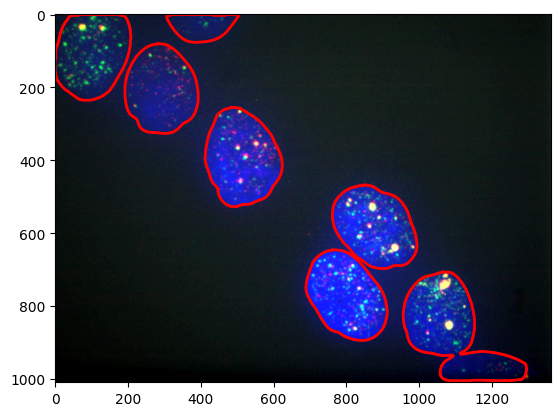

2/2
/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files_2dtif/Cell type 1 (FaDu) Non-Irradiated/file 2/rawdata/0002/01_norm.png


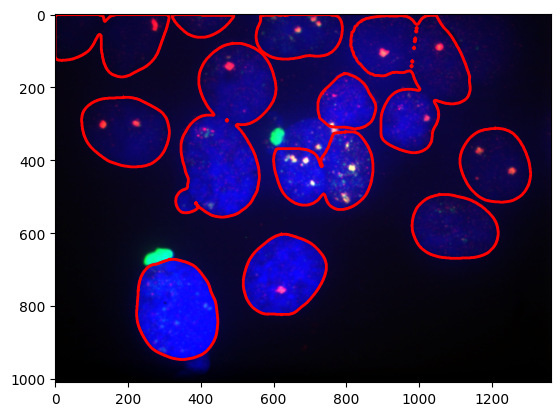

In [ ]:
out_path = data_path + '_2dtif'
model_path = '/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/cellpose_modely/nuc3_20250801_1520'

from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import os
from cellpose import models
from tifffile import imwrite
from skimage.io import imsave, imread
from IPython.display import clear_output
from skimage.morphology import binary_erosion, disk

from kondenzace_jader.utils.visboundaries import visboundaries

fnames = glob(out_path + '/**/*01_mip_norm.png', recursive=True)
print(f'Number of files: {len(fnames)}')


model = models.CellposeModel(gpu=True, pretrained_model=model_path)

for fname_ind, fname in enumerate(fnames):
    print(f'{fname_ind+1}/{len(fnames)}')
    print(f'{fname}')

    save_name = fname.replace('_mip_norm.png', '') + '_seg.tif'
    save_name_png = fname.replace('_mip_norm.png', '') + '_seg_example.png'

    if os.path.exists(save_name) and os.path.exists(save_name_png)  :
        print('File already exists. Continue to next.')
        continue
    else:
        print('Creating segmentation.')

    data_2d = imread(fname)

    mask, flow, style = model.eval(data_2d)

    os.makedirs(os.path.dirname(save_name), exist_ok=True)
    imwrite(save_name, mask)


    plt.imshow(data_2d)
    visboundaries(binary_erosion(mask>0, disk(1)))
    plt.savefig(save_name_png)
    plt.show()
    plt.close()

    if ((fname_ind  + 1) % 10) == 0:
        clear_output()






## Analýza

1/2
/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files_2dtif/Cell type 1 (FaDu) Non-Irradiated/file 2/rawdata/0001/01_norm.png
Cell 1


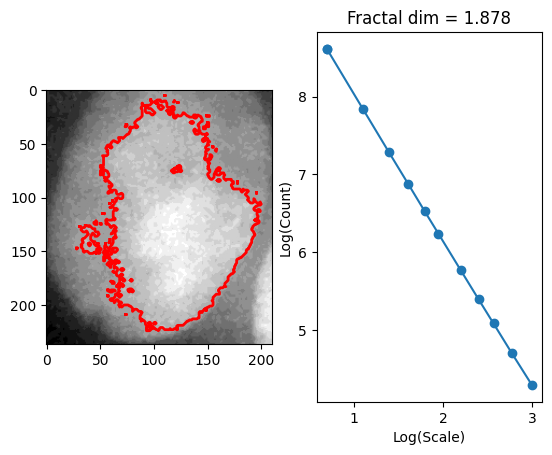

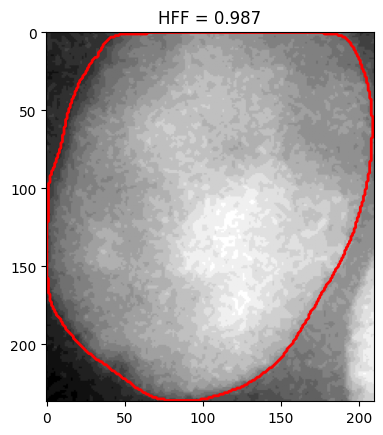

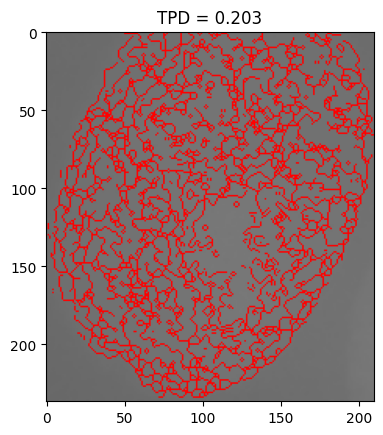

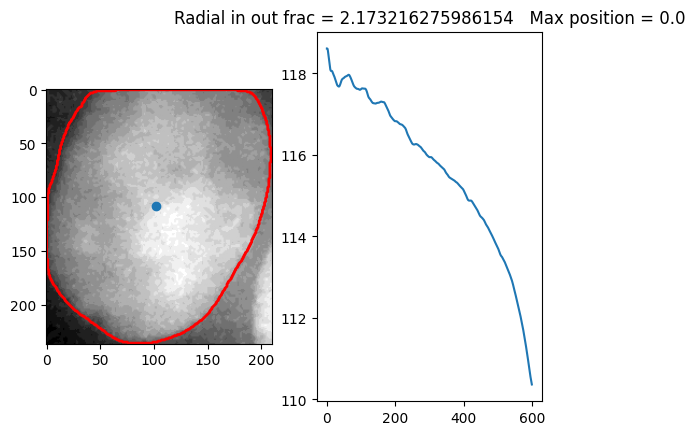

Cell 2


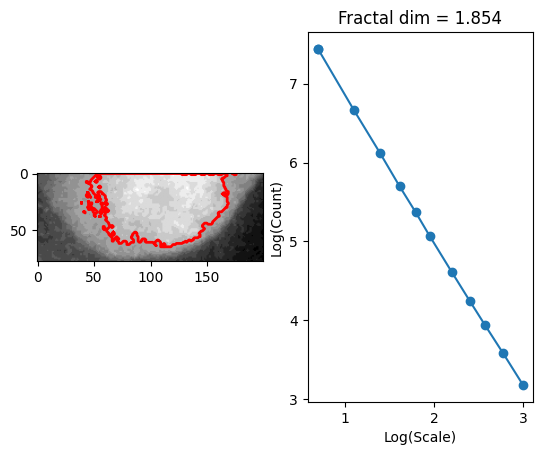

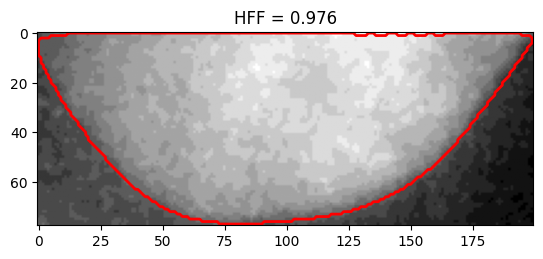

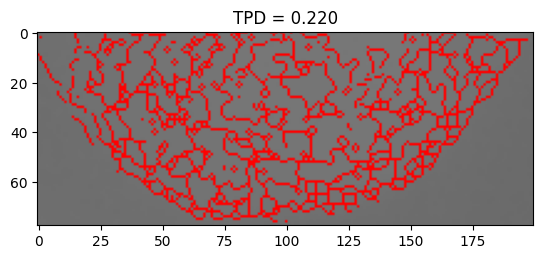

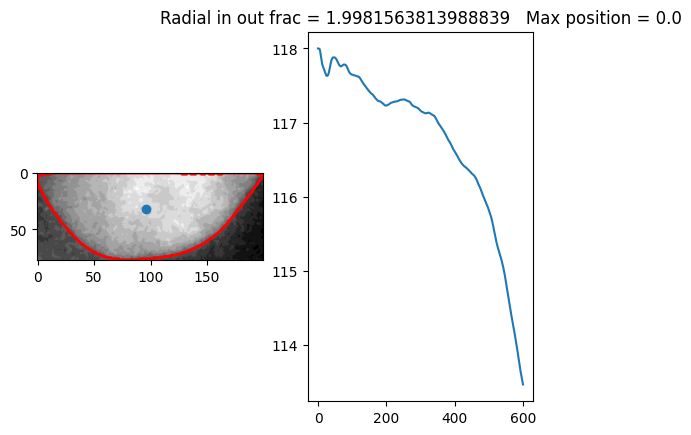

Cell 3


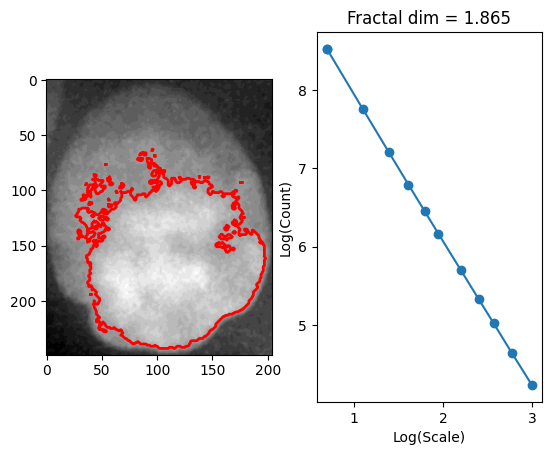

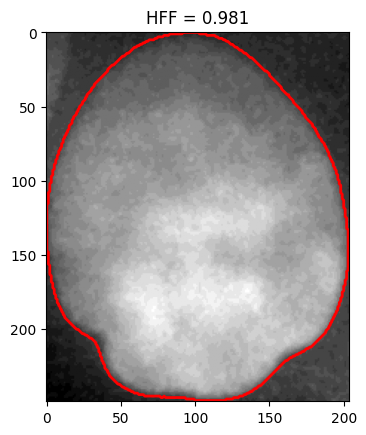

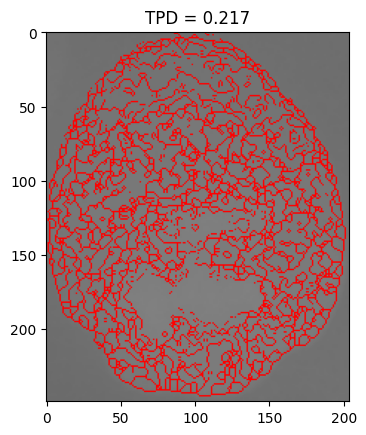

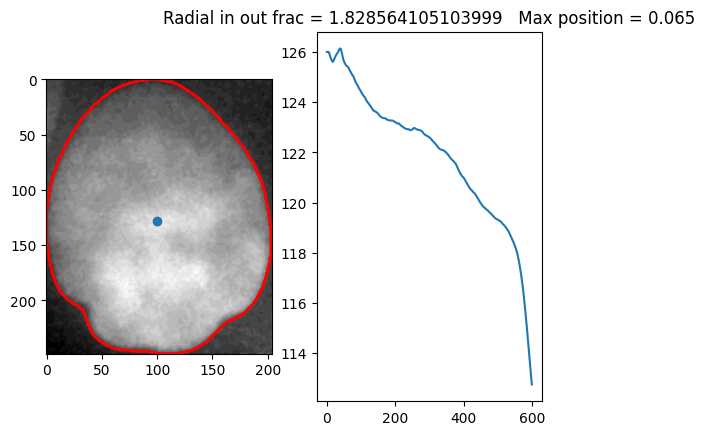

Cell 4


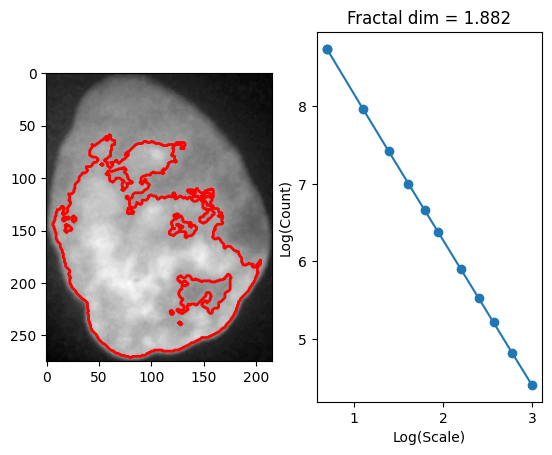

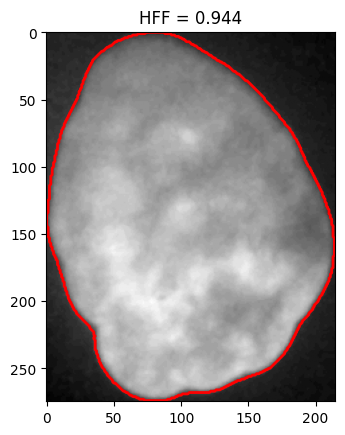

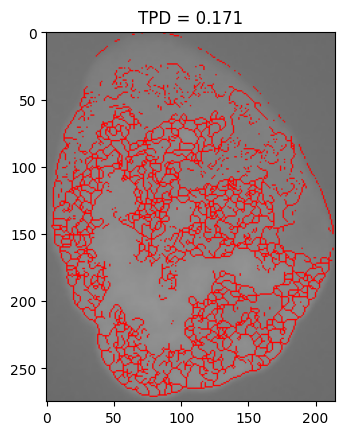

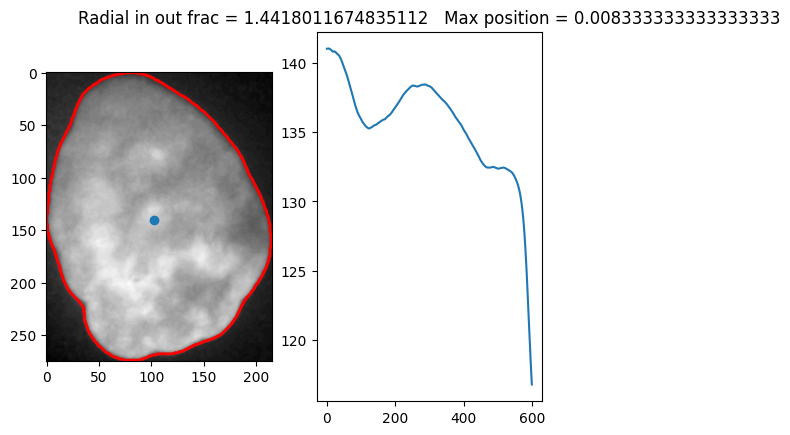

Cell 5


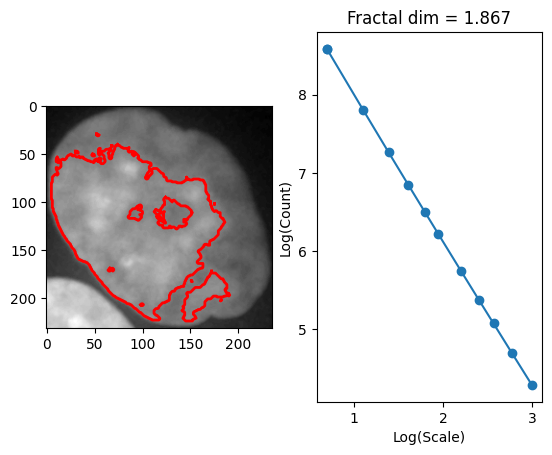

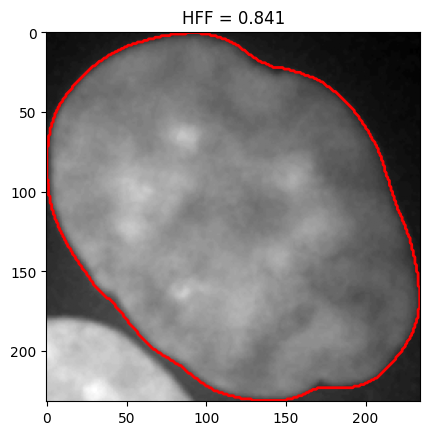

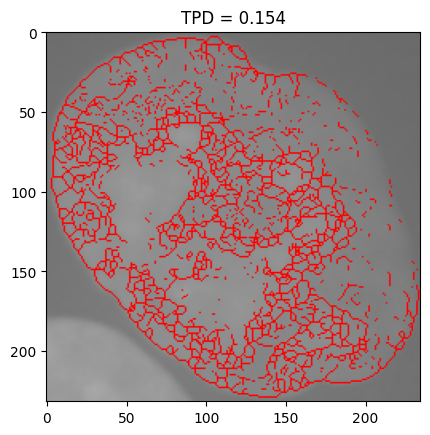

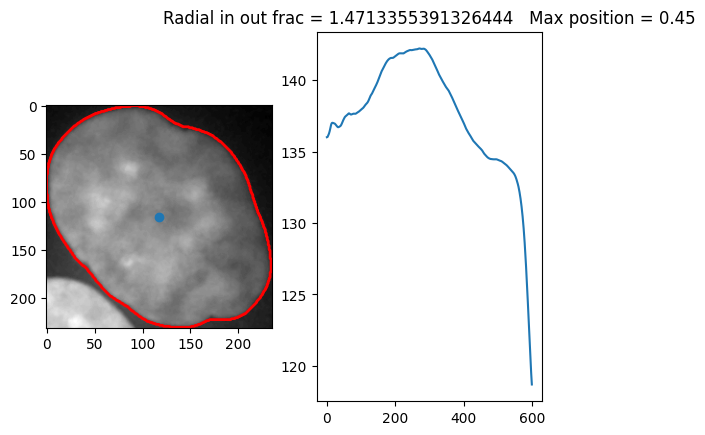

Cell 6


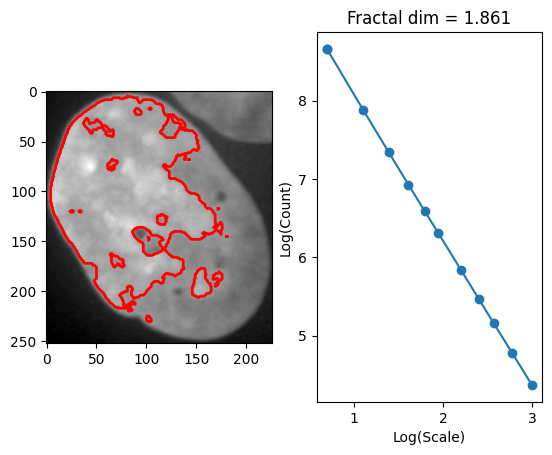

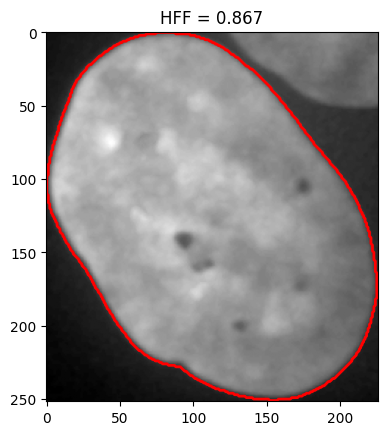

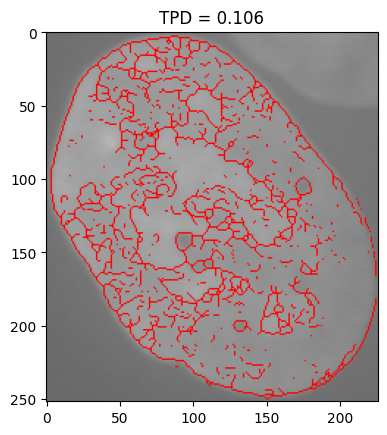

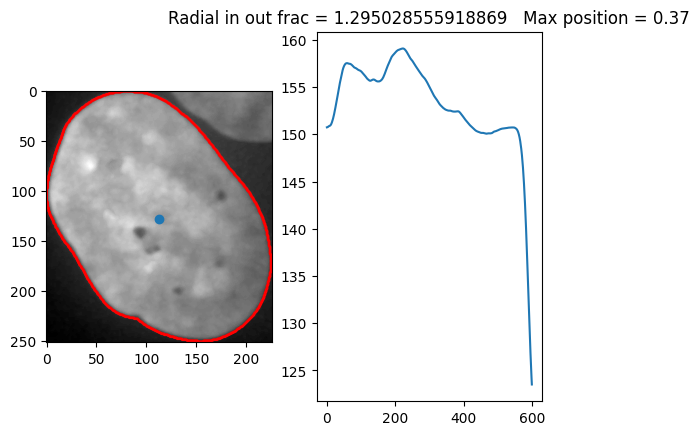

Cell 7


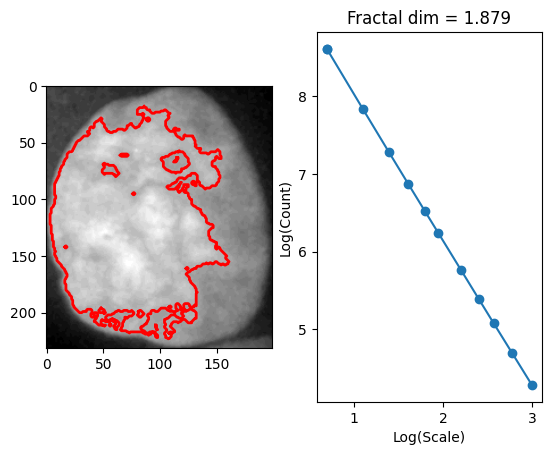

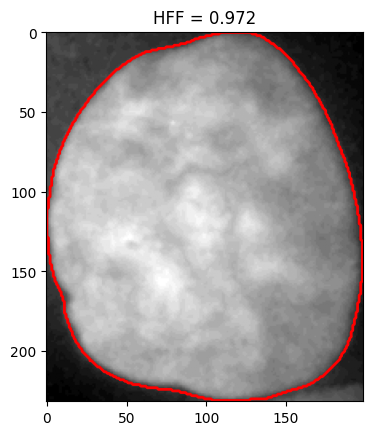

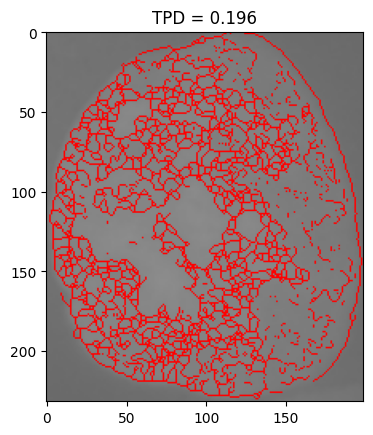

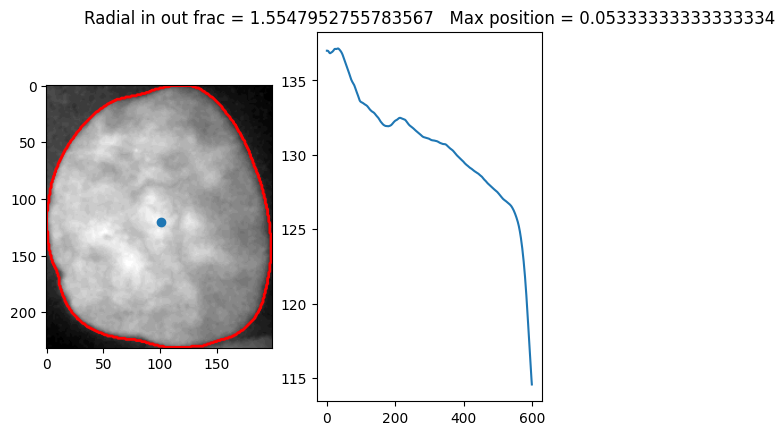

Cell 8


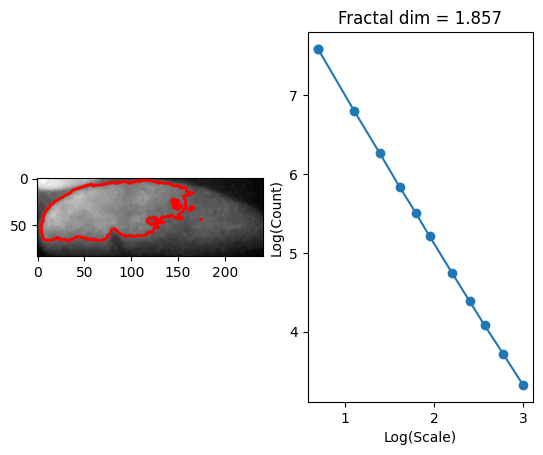

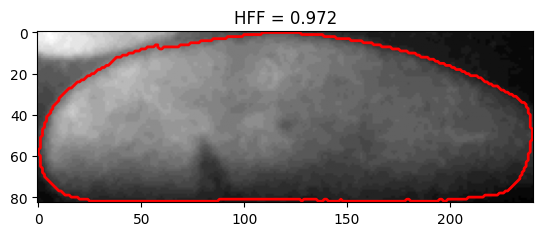

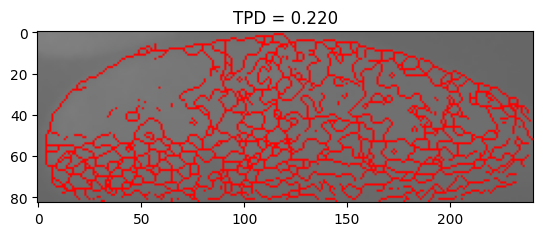

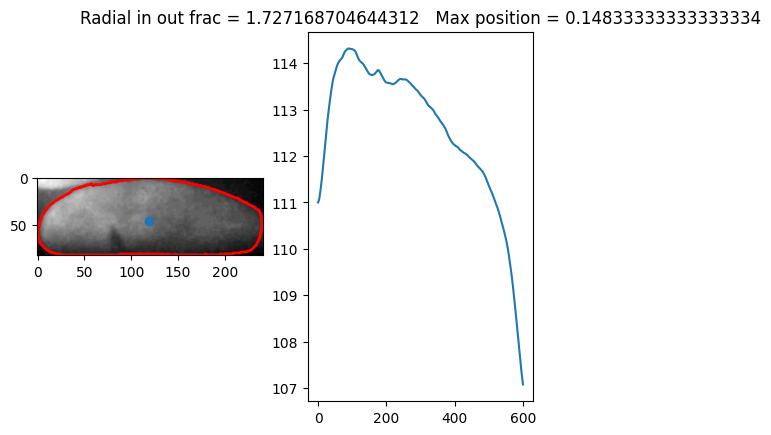

2/2
/content/drive/Shareddrives/martin_data/Chromatin Architecture Analyses Python/Mikroskop horní/zz_Original data files_2dtif/Cell type 1 (FaDu) Non-Irradiated/file 2/rawdata/0002/01_norm.png
Cell 1


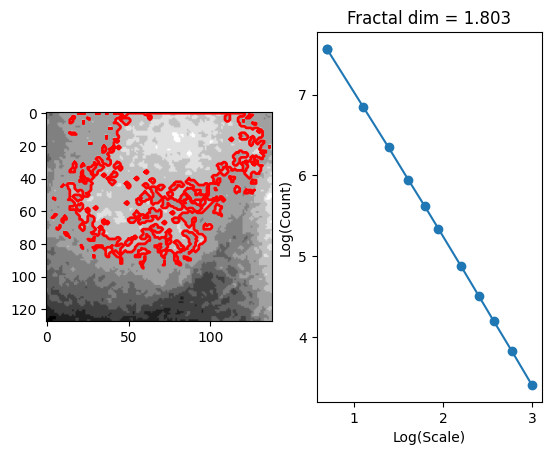

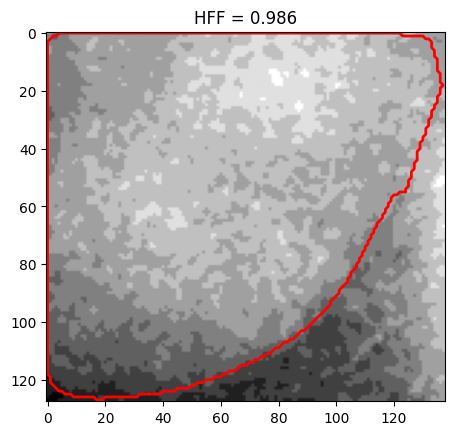

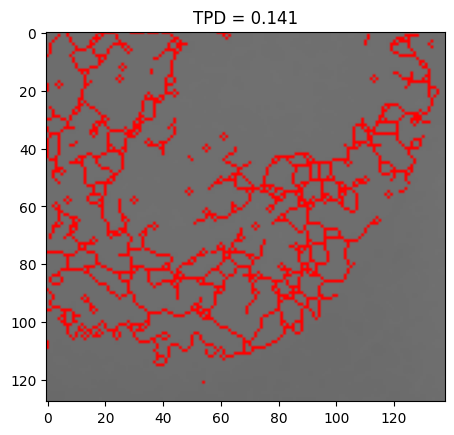

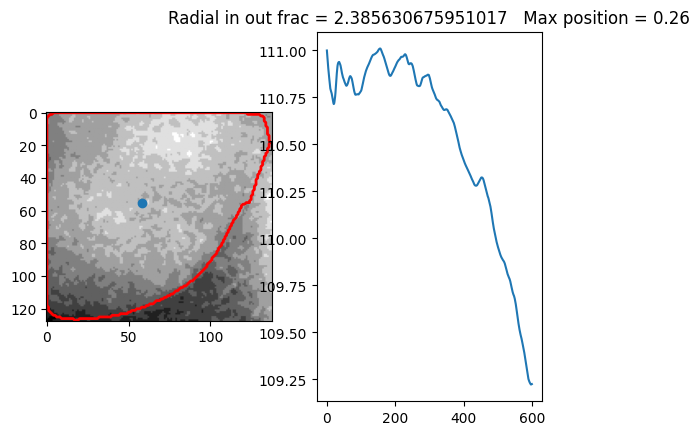

Cell 2


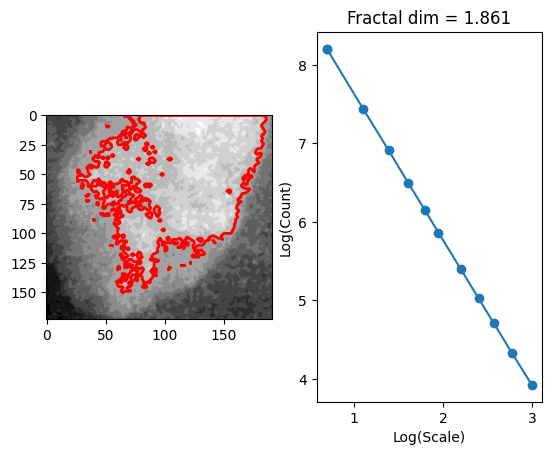

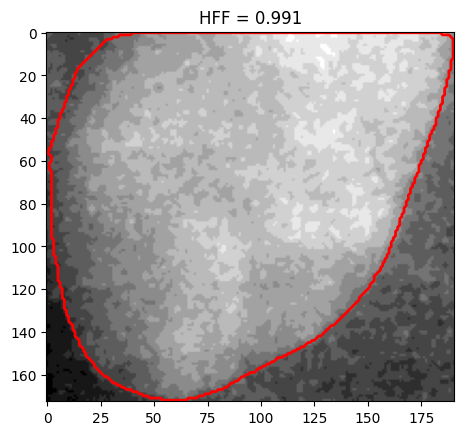

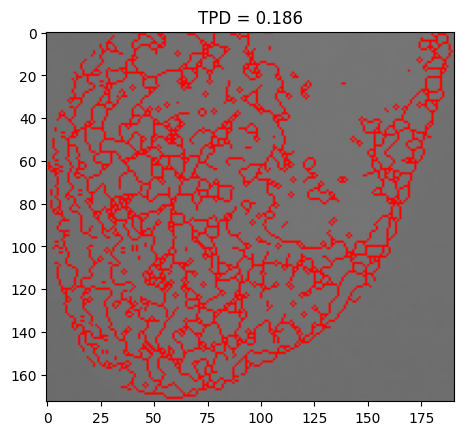

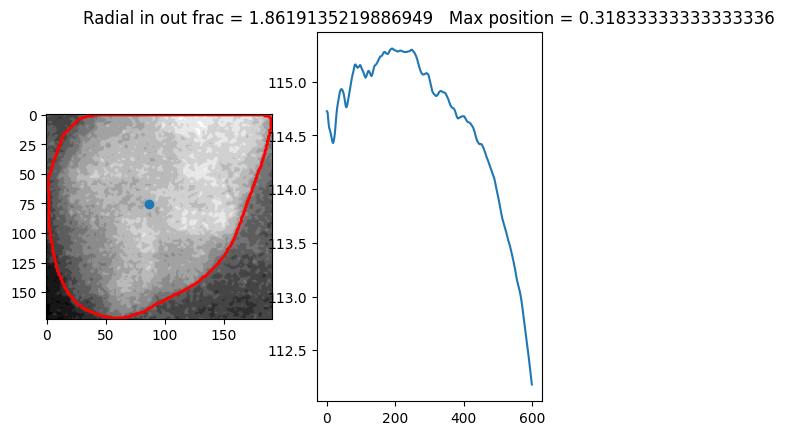

Cell 3


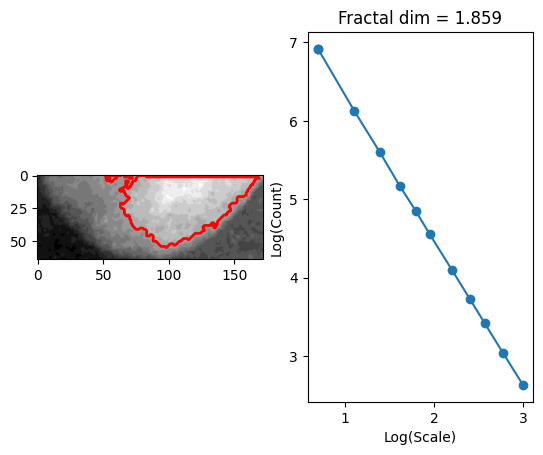

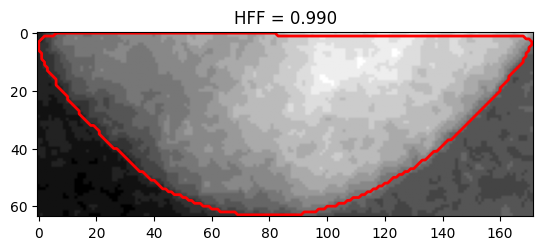

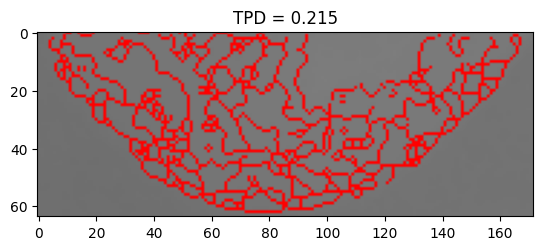

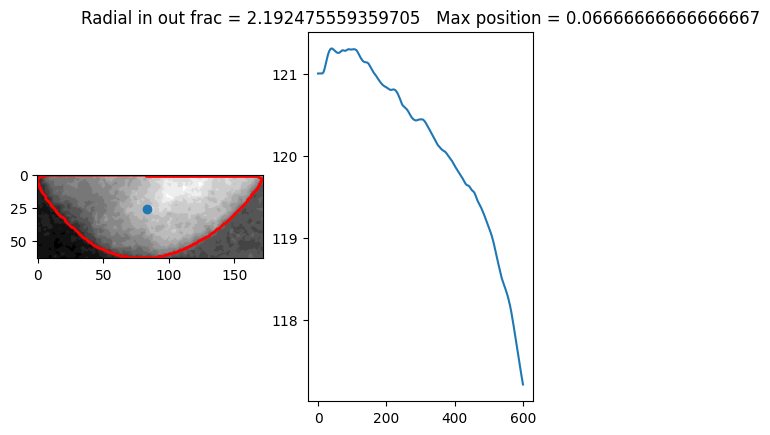

Cell 4


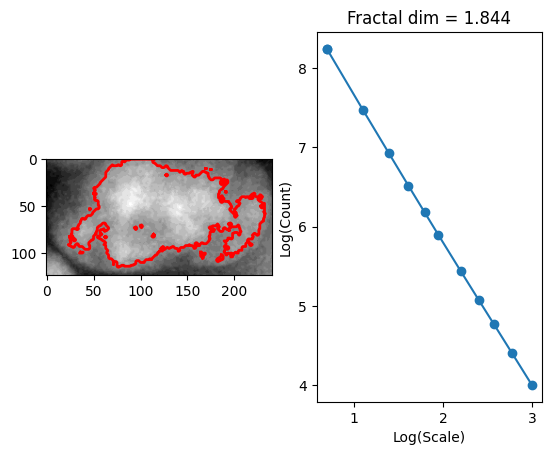

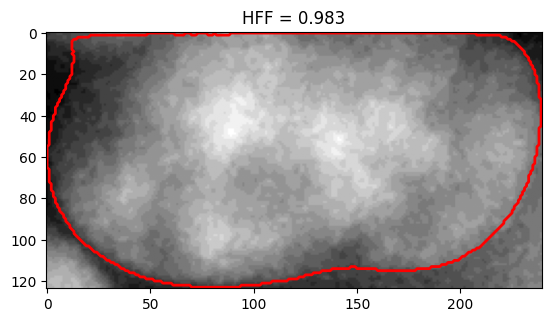

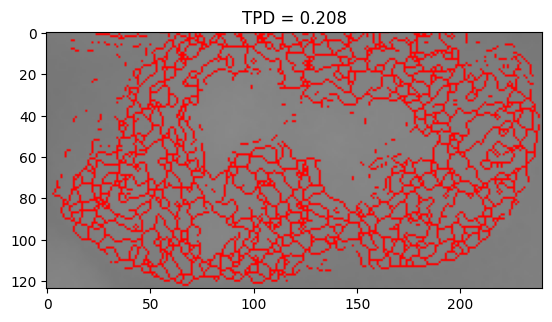

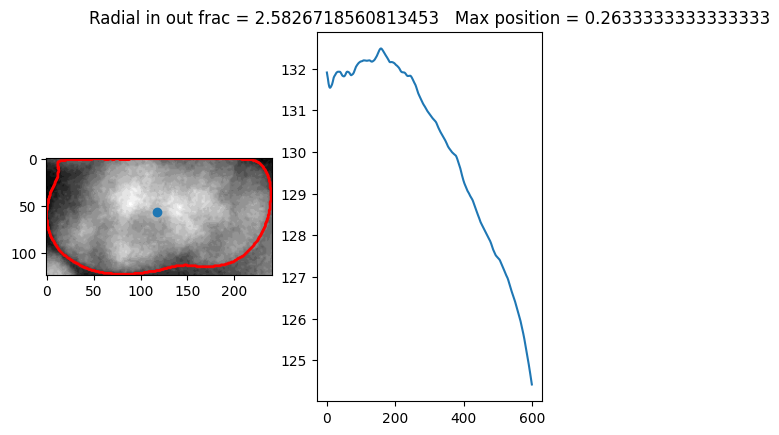

Cell 5


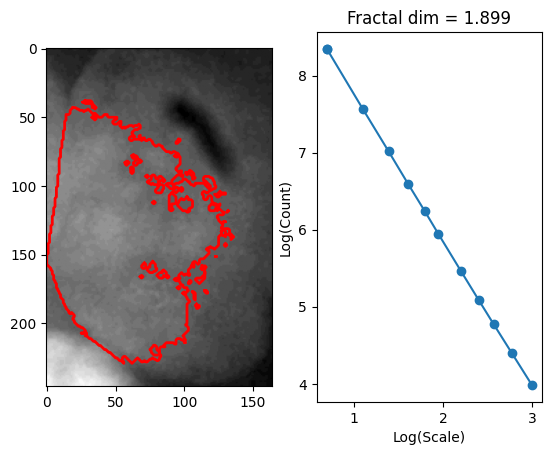

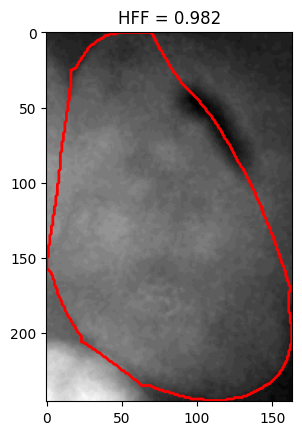

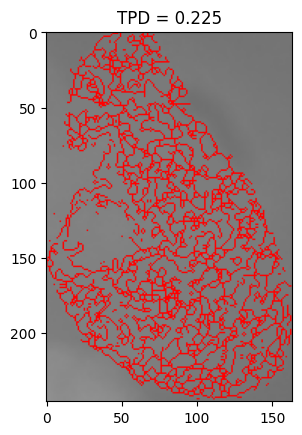

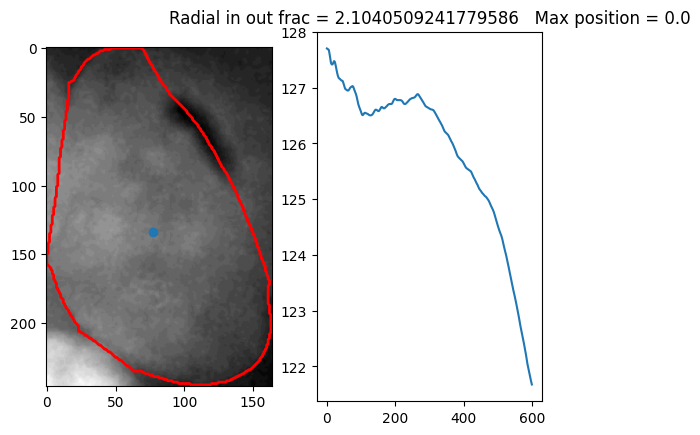

Cell 6


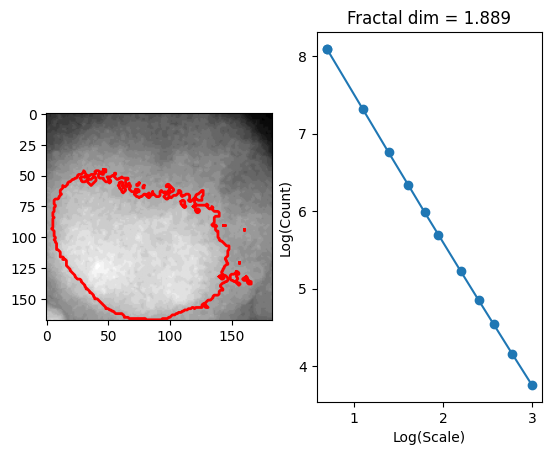

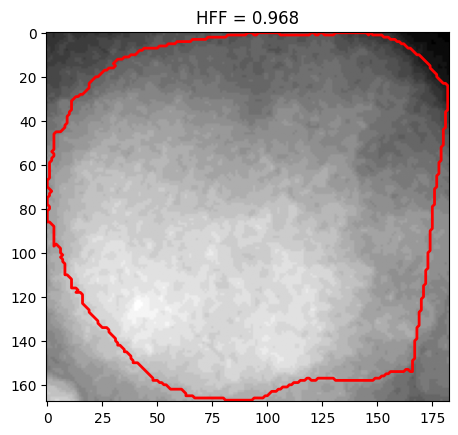

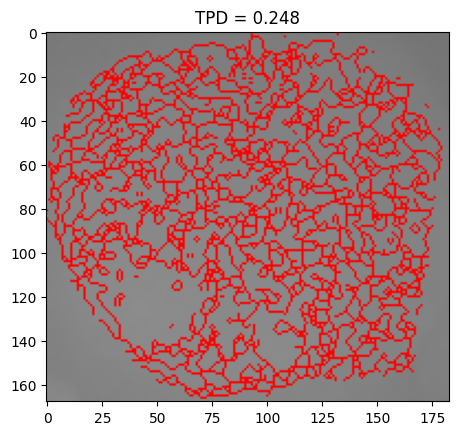

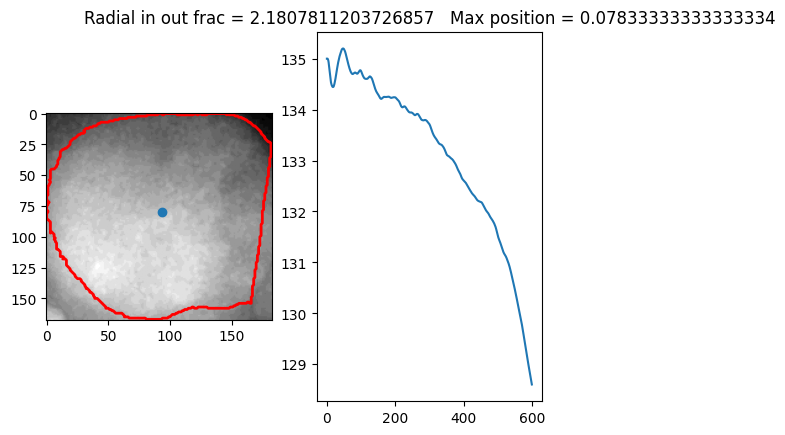

Cell 7


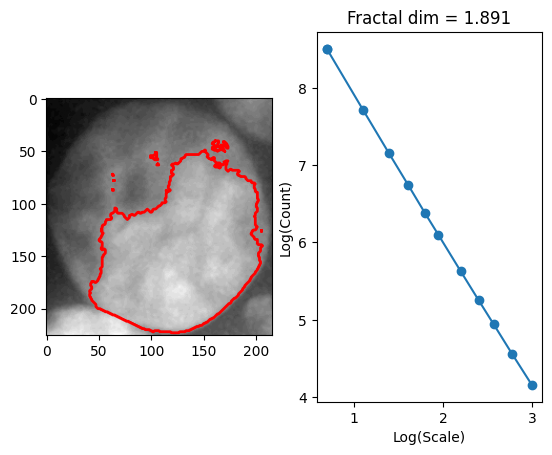

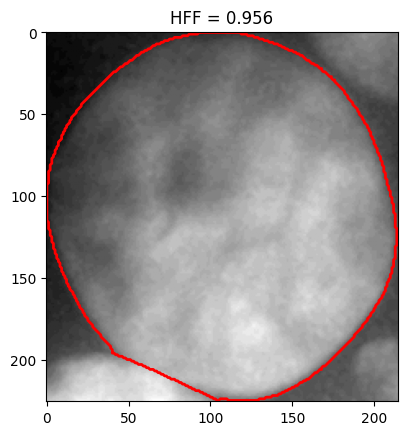

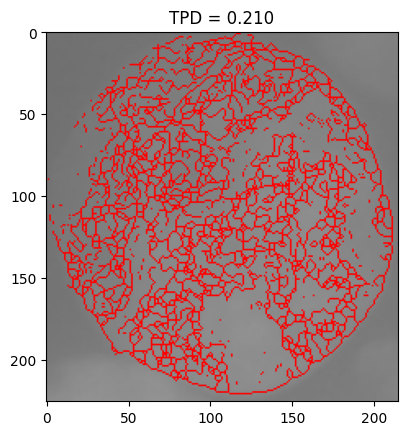

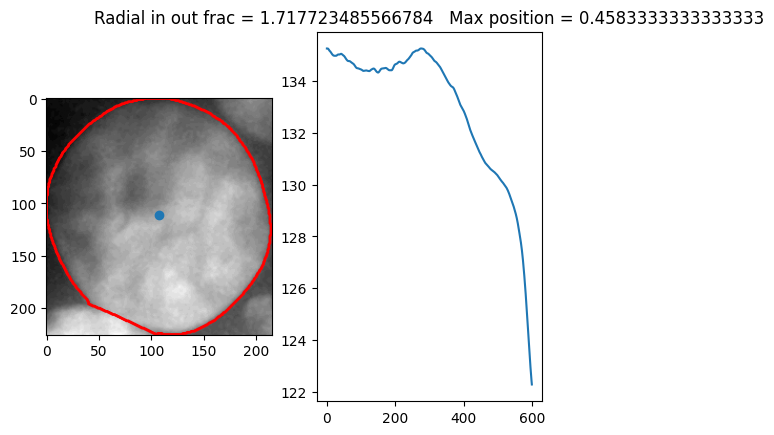

Cell 8


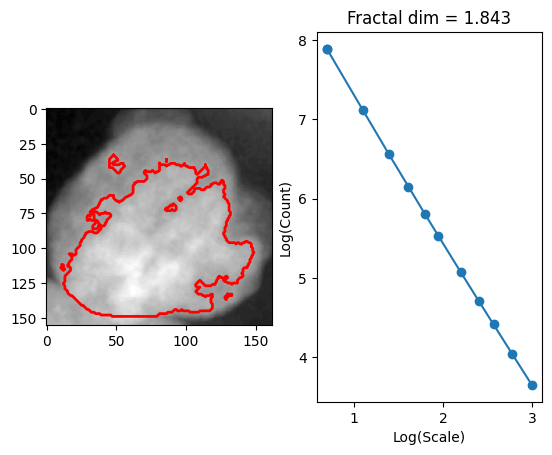

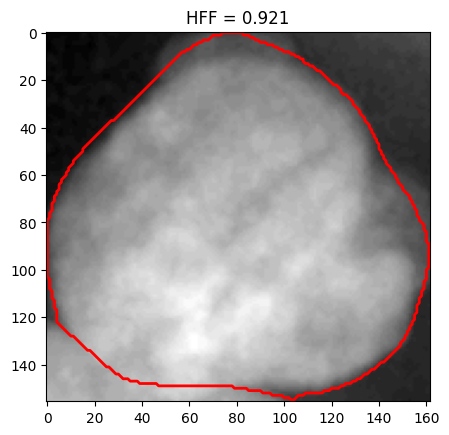

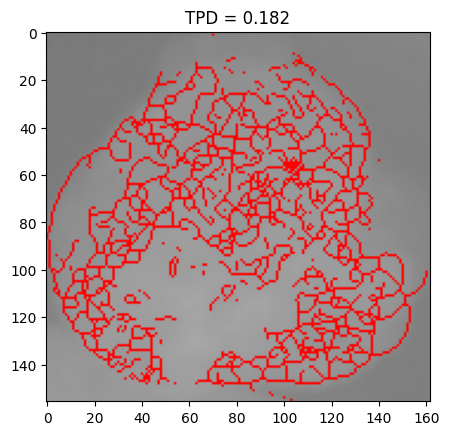

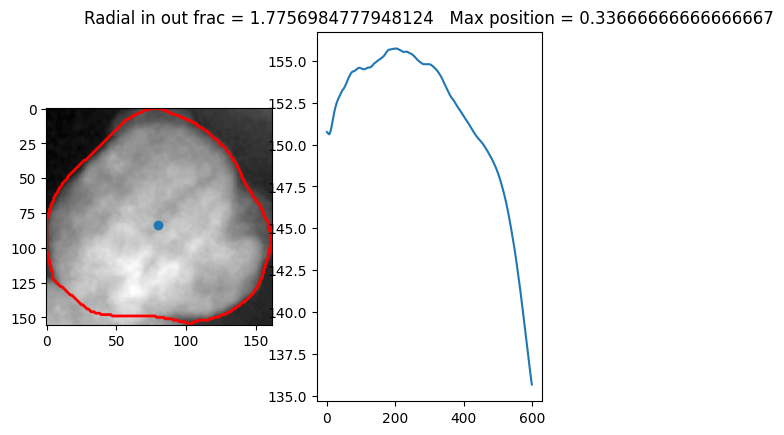

Cell 9


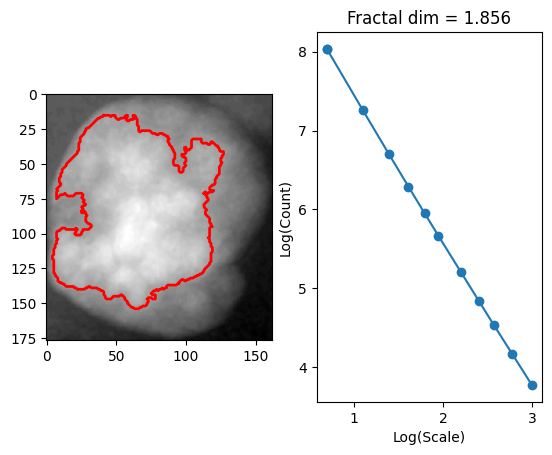

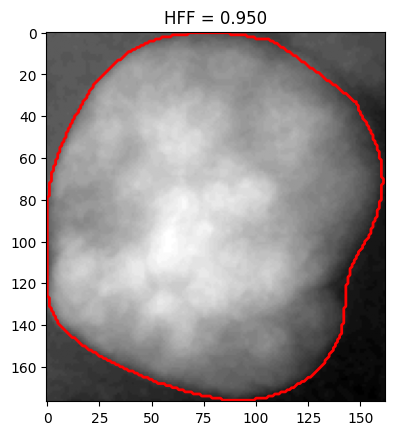

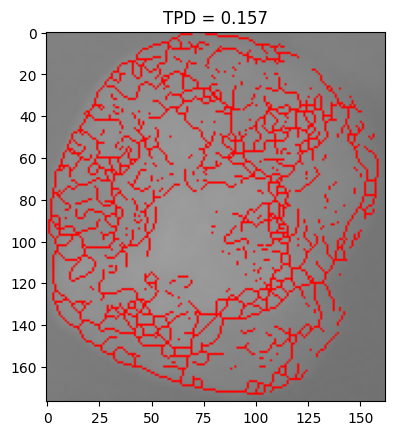

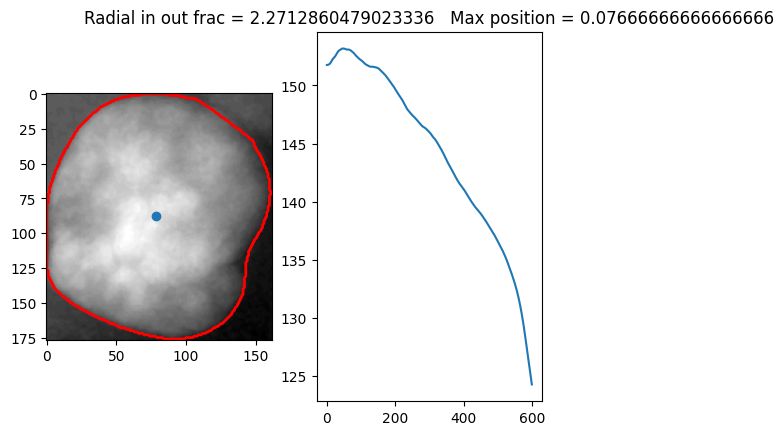

Cell 10


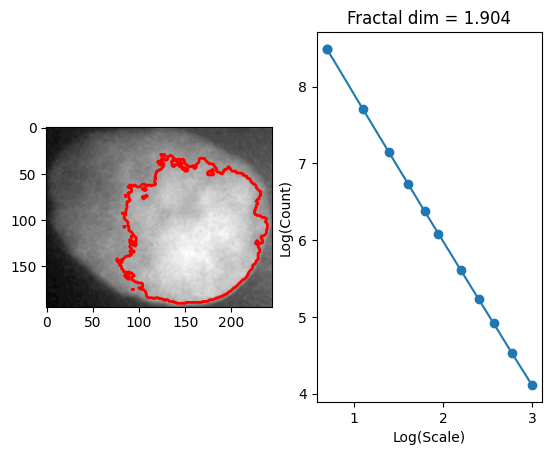

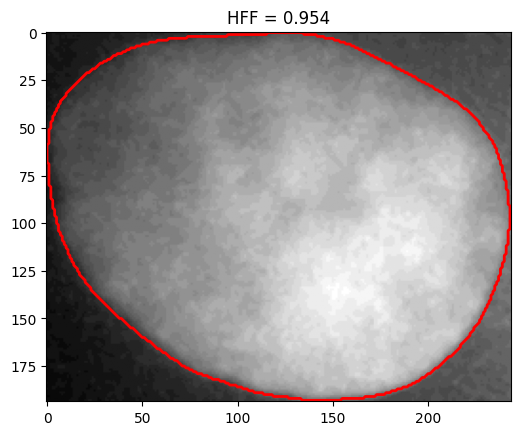

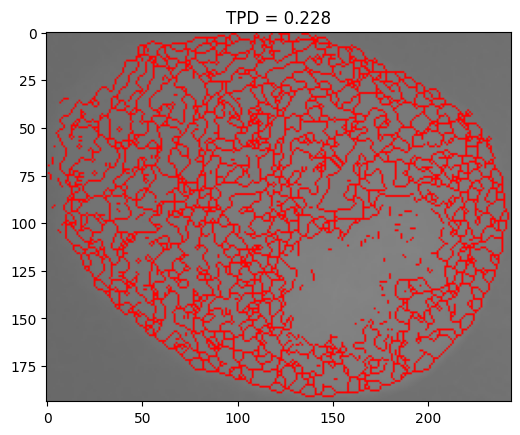

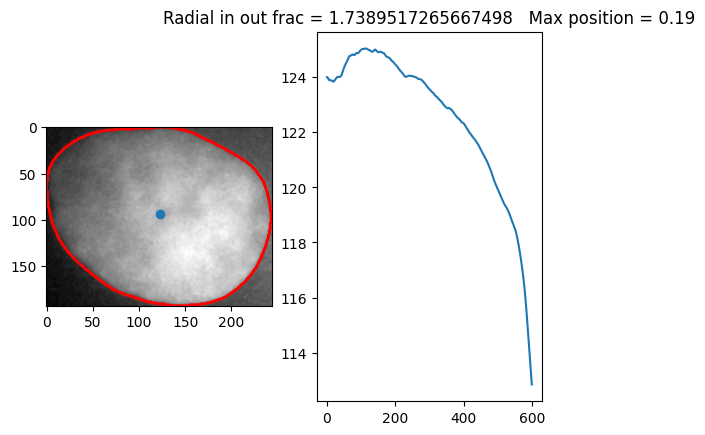

Cell 11


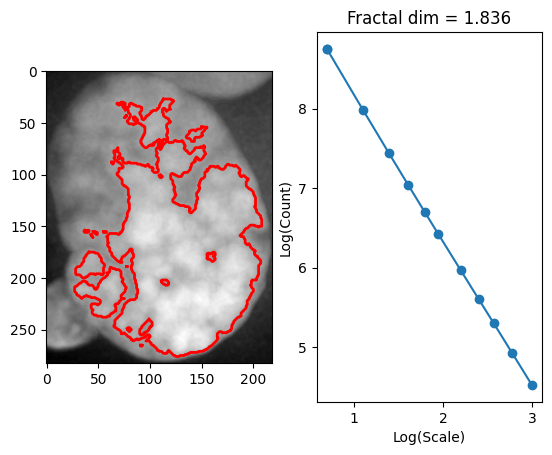

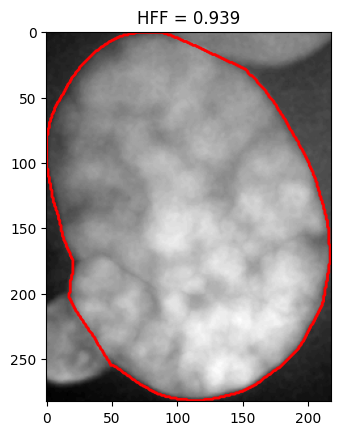

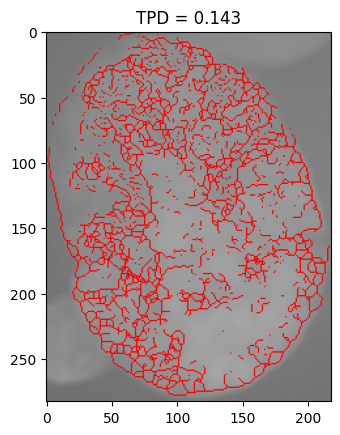

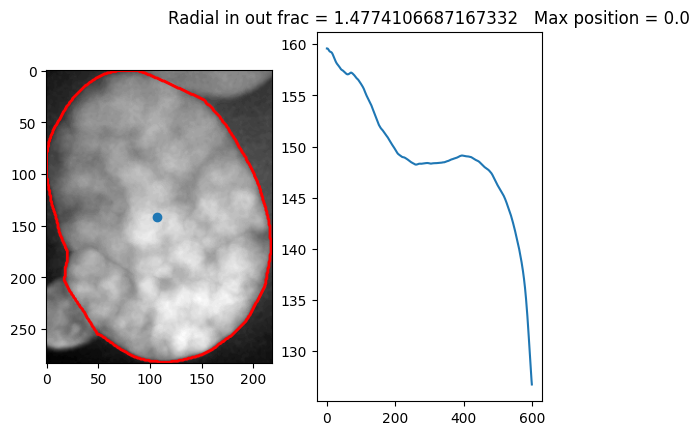

Cell 12


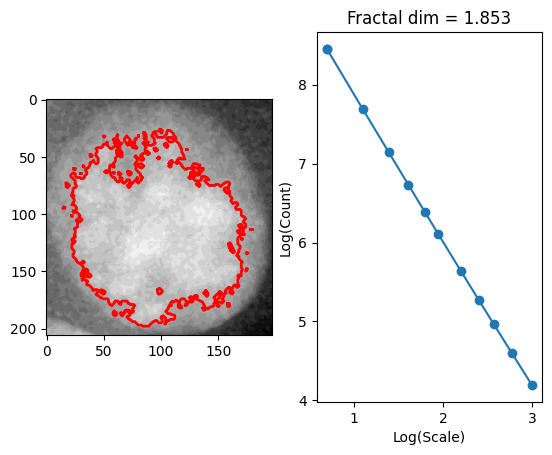

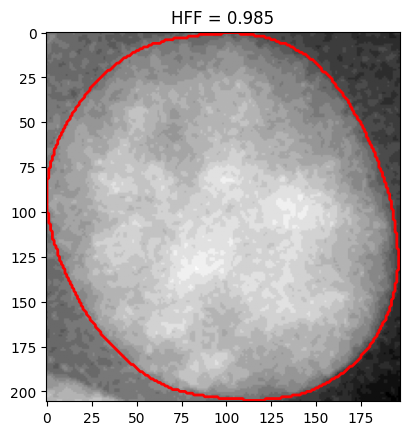

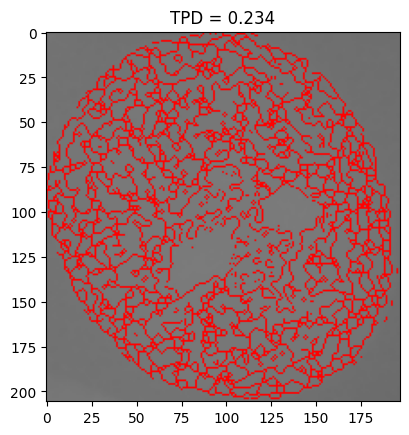

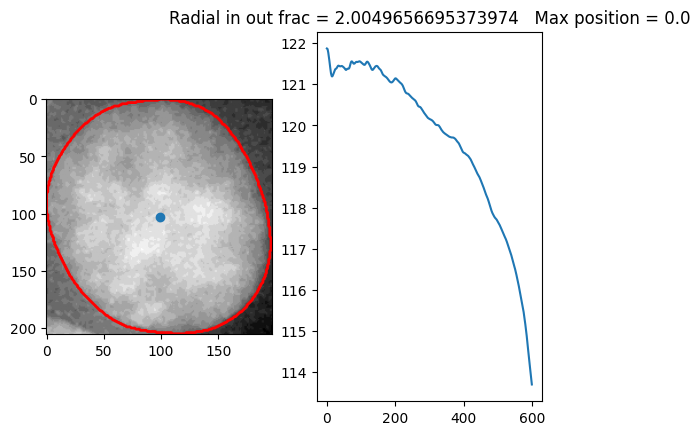

Cell 13


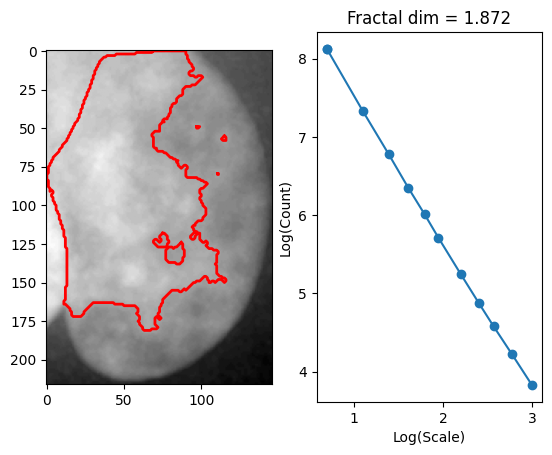

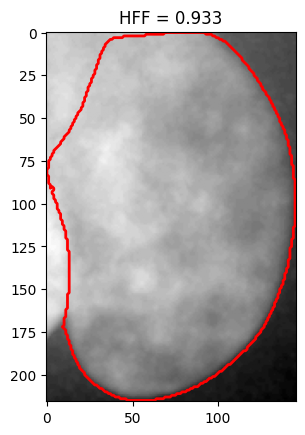

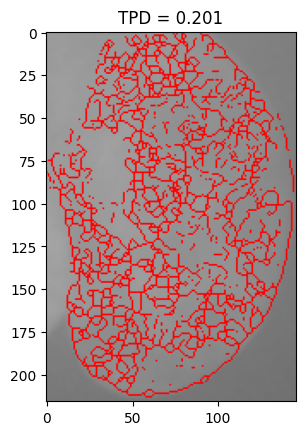

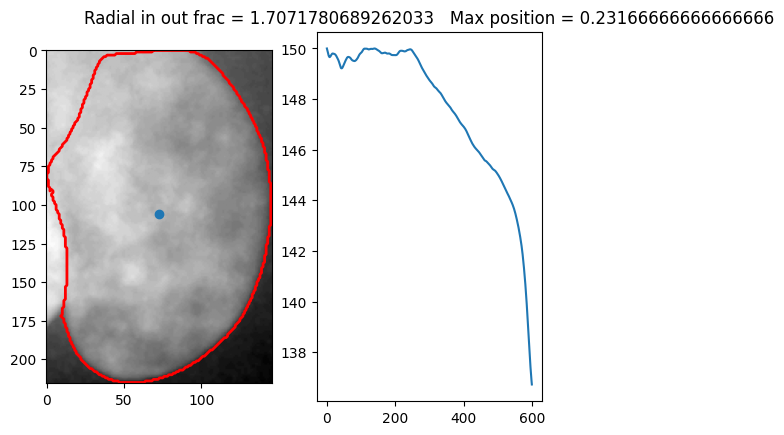

Cell 14


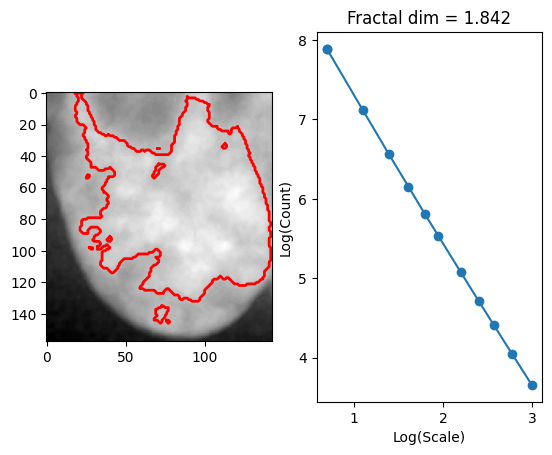

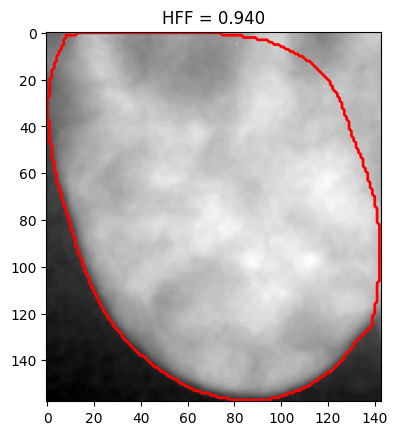

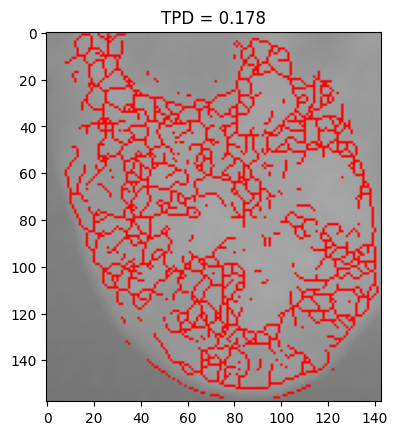

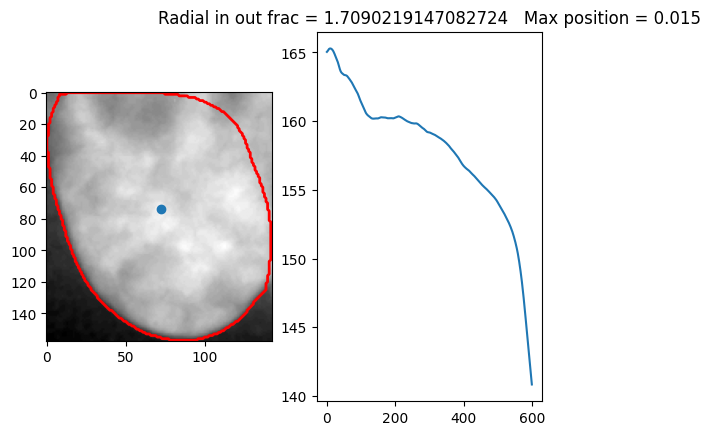

Cell 15


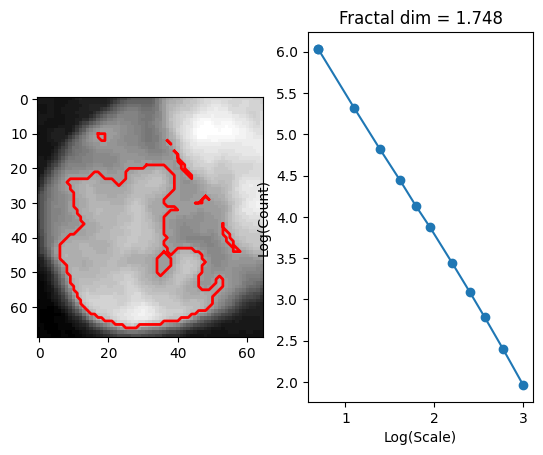

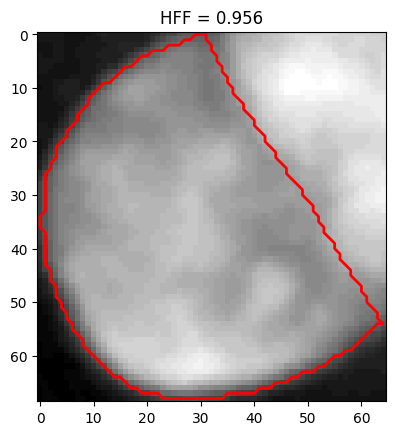

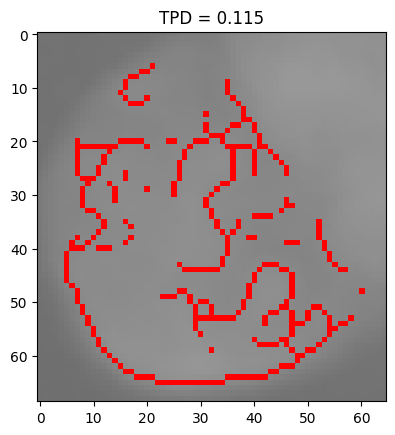

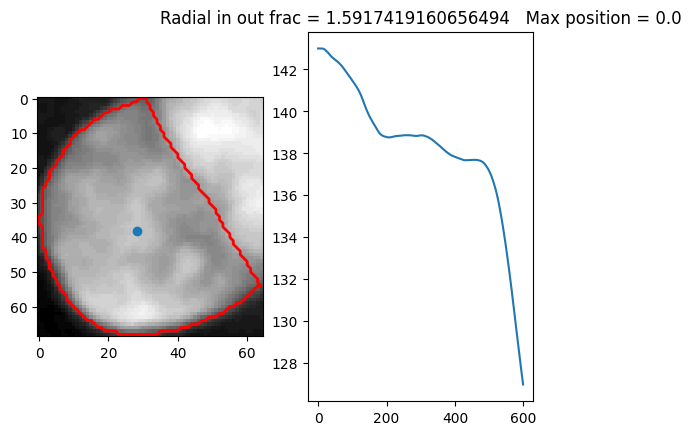

Cell 16


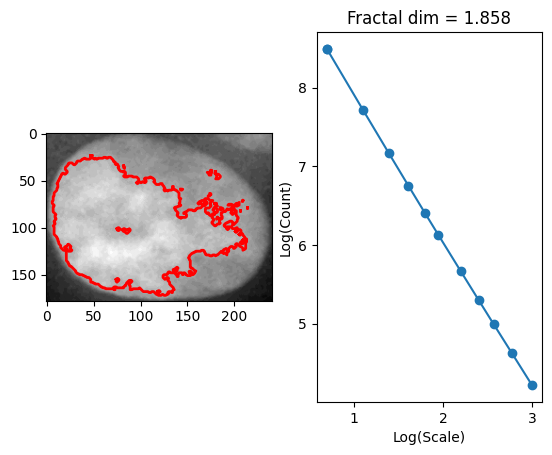

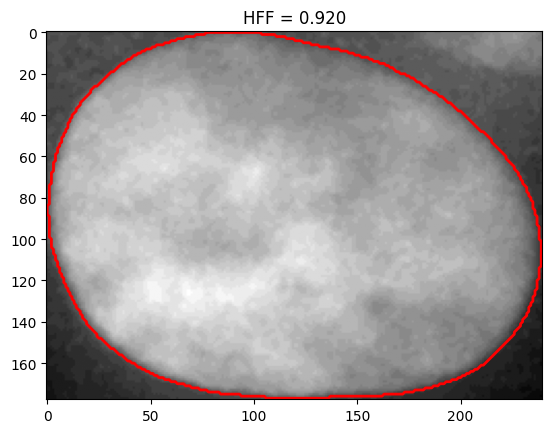

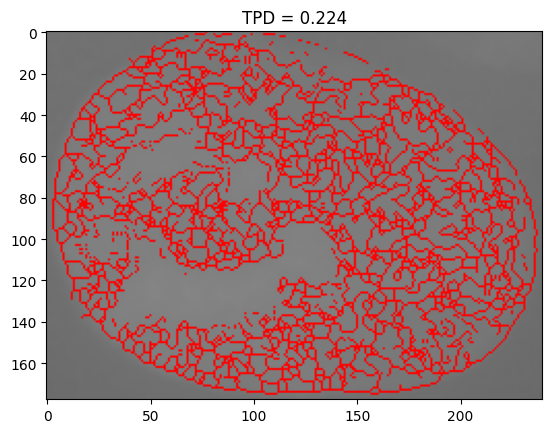

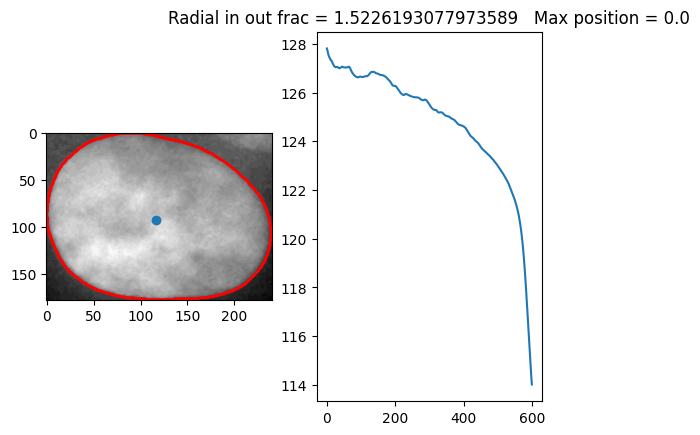

Cell 17


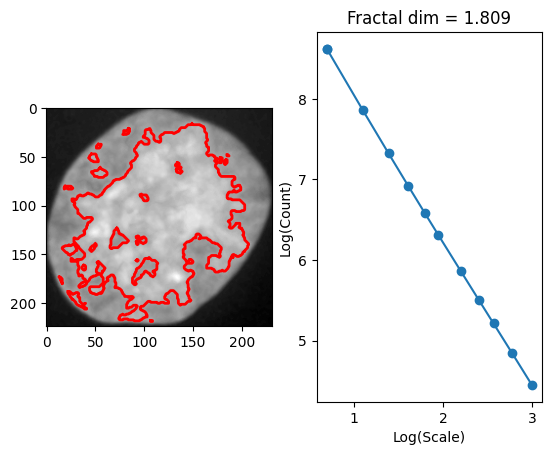

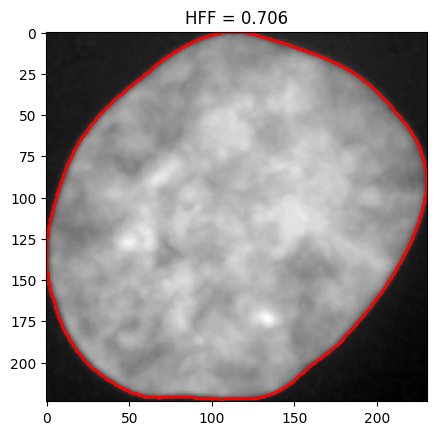

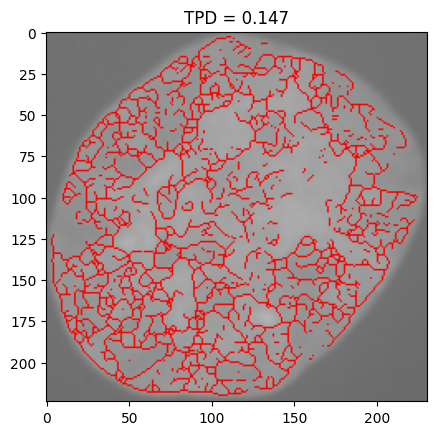

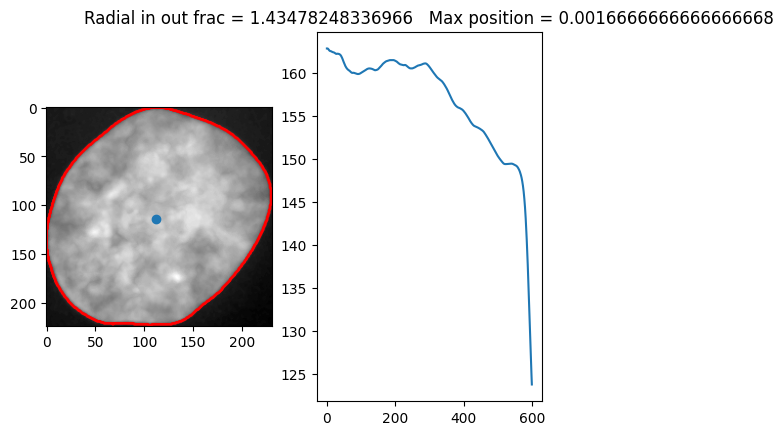

Cell 18


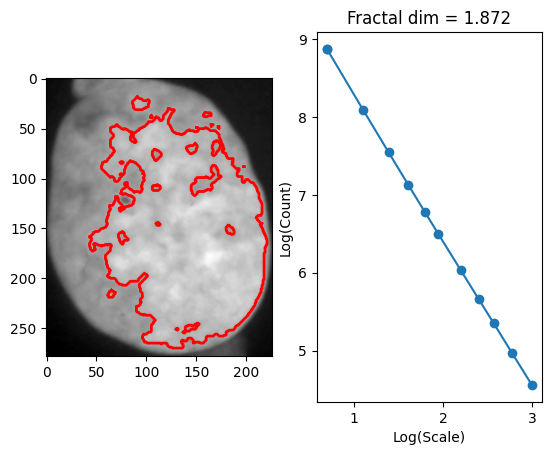

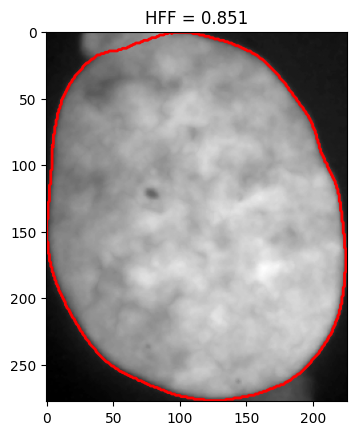

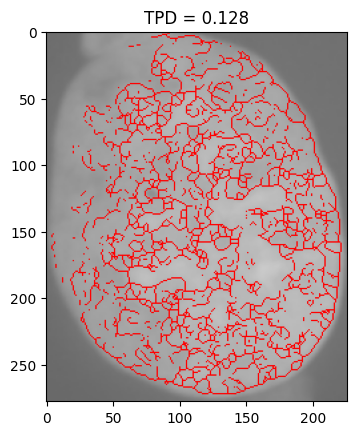

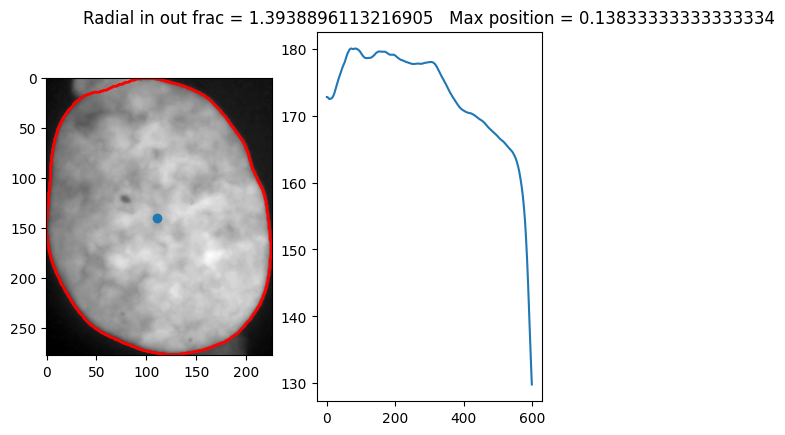

In [ ]:
data2d_path = data_path + '_2dtif'


from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import os
from cellpose import models
import tifffile
import skimage.io
from IPython.display import clear_output
import cv2
from skimage.morphology import binary_erosion, disk
from skimage import exposure
import json

from kondenzace_jader.utils.visboundaries import visboundaries
from kondenzace_jader.utils.mat2gray import mat2gray
from kondenzace_jader.fractal_dim import thresholding_fractal, compute_fractal_dimension
from kondenzace_jader.fourier_hff import hff_mask_only
from kondenzace_jader.radial_analysis import radial_analysis
from kondenzace_jader.total_perimeter_domains_tpd import compute_total_perimeter_domains_tpd, normalize_tpd



fnames = glob(data2d_path + '/**/*01_norm.png', recursive=True)


for fname_ind, fname in enumerate(fnames):
    print(f'{fname_ind+1}/{len(fnames)}')
    print(f'{fname}')



    mask_name = fname.replace('_norm.png', '') + '_seg.tif'
    mask = tifffile.imread(mask_name)


    fname_tif = fname.replace('_norm.png', '') + '.tif'
    img = tifffile.imread(fname_tif)[:,:,2]
    # img =  skimage.io.imread(fname)


    u_cells = np.unique(mask)
    u_cells = u_cells[u_cells>0]

    features = dict()
    for cell_num in u_cells:
        print(f'Cell {cell_num}')


        mask_cell = mask == cell_num

        bbox = cv2.boundingRect(mask_cell.astype(np.uint8))
        img_bbox = img[bbox[1]:bbox[1]+bbox[3], bbox[0]:bbox[0]+bbox[2]]
        mask_bbox = mask_cell[bbox[1]:bbox[1]+bbox[3], bbox[0]:bbox[0]+bbox[2]]






        # binarized_fractal = thresholding_fractal(img_bbox, mask_bbox)

        saturation = 0.35
        p_low, p_high = np.percentile(img_bbox, (saturation, 100 - saturation))
        img_bbox_norm = exposure.rescale_intensity(img_bbox, in_range=(p_low, p_high))
        binarized_fractal = img_bbox_norm > np.mean(img_bbox_norm[mask_bbox])


        fractal_dim, scales, counts = compute_fractal_dimension(binarized_fractal, mask_bbox, plot=False)
        features['fractal_dim'] = fractal_dim

        save_name_fractal = fname.replace('_norm.png', '') + f'_cell_{cell_num}_fractal.png'
        binarized_fractal[mask_bbox == 0] = False

        plt.subplot(1, 2, 1)
        plt.imshow(img_bbox, cmap='gray')
        visboundaries(binarized_fractal)
        plt.subplot(1, 2, 2)
        plt.plot(np.log(scales), np.log(counts), marker='o')
        plt.xlabel('Log(Scale)')
        plt.ylabel('Log(Count)')
        plt.title(f'Fractal dim = {fractal_dim:.3f}')
        plt.savefig(save_name_fractal)
        plt.show()
        plt.close()



        hff = hff_mask_only(img_bbox, mask_bbox)
        save_name_hff = fname.replace('_norm.png', '') + f'_cell_{cell_num}_fourier.png'
        plt.imshow(img_bbox, cmap='gray')
        visboundaries(mask_bbox>0)
        plt.title(f'HFF = {hff:.3f}')
        plt.savefig(save_name_hff)
        plt.show()
        plt.close()

        features['fourier_hff'] = hff



        img_norm = normalize_tpd(img_bbox)
        tpd, skeleton, edges_bin = compute_total_perimeter_domains_tpd(img_norm, mask_bbox)

        save_name_tpd = fname.replace('_norm.png', '') + f'_cell_{cell_num}_tpd.png'
        skeleton_2show = np.repeat(img_bbox[:,:,np.newaxis], 3, axis=2)
        skeleton_2show[skeleton] = [255, 0, 0]
        plt.imshow(skeleton_2show)
        plt.title(f'TPD = {tpd:.3f}')
        plt.savefig(save_name_tpd)
        plt.show()
        plt.close()

        features['tpd'] = tpd




        radial_signal, center_of_mass = radial_analysis(img_bbox, mask_bbox)

        split_position = 0.7
        radial_signal_norm = mat2gray(radial_signal)
        inner = np.mean(radial_signal_norm[:int(len(radial_signal_norm)*split_position)])
        outer = np.mean(radial_signal_norm[int(len(radial_signal_norm)*split_position):])
        radial_in_out_fraction = inner / outer
        max_position = np.argmax(radial_signal) / len(radial_signal)

        features['radial_in_out_fraction'] = radial_in_out_fraction
        features['radial_max_position'] = max_position


        save_name_radial = fname.replace('_norm.png', '') + f'_cell_{cell_num}_radial.png'
        plt.figure()
        plt.subplot(1, 2, 1)
        plt.imshow(img_bbox, cmap='gray')
        visboundaries(mask_bbox>0)
        plt.scatter(center_of_mass[1], center_of_mass[0])
        plt.subplot(1, 2, 2)
        plt.plot(radial_signal)
        plt.title(f'Radial in out frac = {radial_in_out_fraction}   Max position = {max_position}')
        plt.savefig(save_name_radial)
        plt.show()
        plt.close()


        savename_features = fname.replace('_norm.png', '') + f'_cell_{cell_num}_features.json'
        with open(savename_features, 'w') as f:
            json.dump(features, f, indent=2)









    if ((fname_ind  + 1) % 3) == 0:
        clear_output()

















## Teď je čas umazat všechny obrázky co nevycházejí pěkně!


## Agregace výsledků do finální tabulky